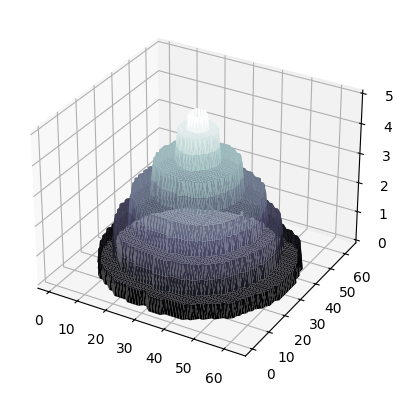

ValueError: invalid literal for int() with base 10: ''

In [ ]:
#3d model generator. Run this to produce a 3d model that matches the dataset.

import numpy as np
import skimage as skimage
from skimage import io, transform
import os
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt


from skimage import measure

def load_images(directory):
    files = sorted([os.path.join(directory, file) for file in os.listdir(directory) if file.endswith('.png')])
    images = [io.imread(file, as_gray=True) for file in files]
    # Stack images into a single 3D array (assuming all images are the same size)
    volume = np.stack(images, axis=-1)
    return volume


# Example directory path


def segment_brain(volume, percentile=90):
    # Calculate the threshold based on the desired percentile of the brightness distribution
    threshold = np.percentile(volume, percentile)
    segmented = volume > threshold
    return segmented.astype(np.float32)

def plot_3d(verts, faces):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_trisurf(verts[:, 0], verts[:,1], faces, verts[:, 2], cmap='bone', lw=1)
    plt.show()



def extract_surface(volume, level=0.5):
    verts, faces, normals, values = measure.marching_cubes(volume, level=level)
    return verts, faces, normals
def write_obj(filename, verts, faces, normals):
    """Write the mesh to an OBJ file format."""
    with open(filename, 'w') as file:
        for v in verts:
            file.write(f"v {v[0]} {v[1]} {v[2]}\n")
        for face in faces:
            # OBJ Files are 1-indexed so we need to add 1 to each index
            file.write("f {} {} {}\n".format(face[0] + 1, face[1] + 1, face[2] + 1))
        #Oliver's edit to include vertex normals
        for v_normal in normals:
            file.write(f"vn {v_normal[0]} {v_normal[1]} {v_normal[2]}\n")


directory_path = input("Input  Image Directory")
threathhold = int(input("Input Threashhold"))

while (directory_path!="1"):
    volume = load_images(directory_path)
    segmented_volume = segment_brain(volume, threathhold)
    verts, faces, normals = extract_surface(segmented_volume)
    #OP

    plot_3d(verts, faces)
    write_obj("output_brain_model.obj", verts, faces, normals)
    directory_path = input("Input  Image Directory")
    threathhold = int(input("Input Threashhold"))


In [3]:

#Rotates, and transforms the output_brain_model_cnn_result.obj model to be centered, and outputs it as adjusted_model_trimesh_treated.obj

#Keanu's trimesh model fixing code below:

import numpy as np
import trimesh
import pyglet

# Use a model output by the previous code cell, from an image set.
mesh = trimesh.load(r'C:\Users\keanu\DICOM_TO_PNG\output_brain_model.obj')

# Uncomment the following to test an example obj model that has been premade with marching cubes
# You must also comment out the above mesh = ... code.
#mesh = trimesh.load(r'output_brain_model_premade_cnn_result.obj')

centroid = mesh.centroid
mesh.vertices -= centroid
theta = -np.pi / 2  # -90 degrees in radians
rotation_matrix = np.array([
    [1, 0, 0],
    [0, np.cos(theta), -np.sin(theta)],
    [0, np.sin(theta), np.cos(theta)]
])

rotated_vertices = np.dot(mesh.vertices, rotation_matrix.T)
centroid = np.mean(rotated_vertices, axis=0)
centered_vertices = rotated_vertices - centroid
adjusted_mesh = trimesh.Trimesh(vertices=centered_vertices, faces=mesh.faces, vertex_normals=mesh.vertex_normals)
adjusted_mesh.invert()

adjusted_mesh.export('adjusted_model_trimesh_treated.obj')

'# https://github.com/mikedh/trimesh\nv -44.12597793 1.27213004 9.82588783\nv -43.62597793 0.77213004 9.82588783\nv -43.62597793 1.27213004 10.32588783\nv -43.62597793 1.77213004 9.82588783\nv -44.12597793 1.27213004 8.82588783\nv -43.62597793 0.77213004 8.82588783\nv -43.62597793 1.77213004 8.82588783\nv -43.62597793 1.27213004 8.32588783\nv -44.12597793 -1.72786996 4.82588783\nv -43.62597793 -2.22786996 4.82588783\nv -43.62597793 -1.72786996 5.32588783\nv -43.62597793 -1.22786996 4.82588783\nv -43.62597793 -1.72786996 4.32588783\nv -43.12597793 1.27213004 11.82588783\nv -42.62597793 0.77213004 11.82588783\nv -42.62597793 1.27213004 12.32588783\nv -42.62597793 1.77213004 11.82588783\nv -43.12597793 0.27213004 10.82588783\nv -42.62597793 -0.22786996 10.82588783\nv -42.62597793 0.27213004 11.32588783\nv -43.12597793 1.27213004 10.82588783\nv -42.62597793 2.27213004 11.32588783\nv -43.12597793 2.27213004 10.82588783\nv -42.62597793 2.77213004 10.82588783\nv -43.12597793 -1.72786996 9.825

In [33]:
#import numpy as np
#from PIL import Image

# Assuming `volume` is your 3D numpy array from the brain scans
#volume_normalized = (255 * (volume - volume.min()) / (volume.max() - volume.min())).astype(np.uint8)

# Select the axis for slicing; here we use 0 for slicing along the first axis
#slices = [volume_normalized[i, :, :] for i in range(volume_normalized.shape[0])]

# Save slices as images
#for i, slice in enumerate(slices):
#    img = Image.fromarray(slice)
#    img.save(f"slice_{i:03}.png")

In [4]:
#artificially insert lines to add a material reference to the adjusted_model_trimesh_treated.obj file.



f = open("adjusted_model_trimesh_treated.obj", "r")
n = open("adjusted_model_trimesh_treated_mat_lines.obj", "w")

#Refer to the mtl file, the material name, and for sharp edges to be set to off.
insert_string = "mtllib generic_material.mtl\nusemtl BRAISEG\ns off\n"
n.write(insert_string)

lines = f.readlines()

'''
with open('adjusted_model_trimesh_treated.obj','r') as f:
    for line in f:
        print(line.rstrip('\n'))
        n.write(line)
'''

#Append contents of original obj file to new obj file.
for line in lines:

    n.write(line)
       
f.close()
n.close()

Code to display final obj file in pygame is in 3d_viewer.py
Running the code in this notebook causes kernel crashes.